In [99]:
using DataFrames
using TimeData
using Econometrics

In [ ]:
loadPlotting()

#### Load data

In [207]:
priceDataRaw = readTimedata("../financial_data/raw_data/scacap_universeE6.csv");

In [204]:
assetInfoRaw = readtable("../financial_data/raw_data/scacap_E6AssetInfo.csv");

#### Remove MIMUJPNN (DE000A0YBR53)

iShares MSCI Japan IMI UCITS ETF is removed meanwhile

In [208]:
tobeRemovedName = "eqJp_MIMUJPNN_Index"

"eqJp_MIMUJPNN_Index"

remove from asset info:

In [220]:
dontRemove = assetInfoRaw[:, :AssetLabel] .!= tobeRemovedName
assetInfo = assetInfoRaw[dontRemove, :];

remove from data:

In [216]:
dontRemove = names(priceDataRaw) .!= symbol(tobeRemovedName)
priceData = priceDataRaw[:, dontRemove];

#### get dimensions

In [217]:
nObs, nAss = size(priceData)

(4303,15)

#### add risk mapping

In [218]:
riskClassMapping = Dict([("cash", 1.), ("covered bonds", 2), 
    ("government bonds", 3), ("corporate bonds", 4),
    ("commodities", 5), ("real estate", 6), ("equities", 7)])

Dict{ASCIIString,Real} with 7 entries:
  "commodities"      => 5
  "real estate"      => 6
  "covered bonds"    => 2
  "corporate bonds"  => 4
  "equities"         => 7
  "government bonds" => 3
  "cash"             => 1.0

In [227]:
riskClasses = zeros(Float64, nAss)
for ii=1:nAss
    thisClass = assetInfo[ii, :AssetClass]
    riskClasses[ii] = riskClassMapping[thisClass]
end

assetInfo[:RiskClass] = riskClasses
assetInfo

,AssetLabel,AssetClass,Region,BloombergTicker,RiskClass
1,cashEu_EMTSDEOI_Index,cash,eu,EMTSDEOI_Index,1.0
2,covEu_IYGB_Index,covered bonds,eu,IYGB_Index,2.0
3,govEu_LEATTREU_Index,government bonds,eu,LEATTREU_Index,3.0
4,govEm_JPEICORE_Index,government bonds,em,JPEICORE_Index,3.0
5,govUs_BCEY4T_Index,government bonds,us,BCEY4T_Index,3.0
6,corpEu_LECPTREU_Index,corporate bonds,eu,LECPTREU_Index,4.0
7,corpUs_IBOXIG_Index,corporate bonds,us,IBOXIG_Index,4.0
8,eqEu_SXXR_Index,equities,eu,SXXR_Index,7.0
9,eqAs_DJAPSDET_Index,equities,as,DJAPSDET_Index,7.0
10,eqEm_NDUEEGF_Index,equities,em,NDUEEGF_Index,7.0


there are no missing values as data is read in as `Timematr` type

In [228]:
typeof(priceData)

Timematr{Date} (constructor with 1 method)

#### Plotting the data

completely as it is

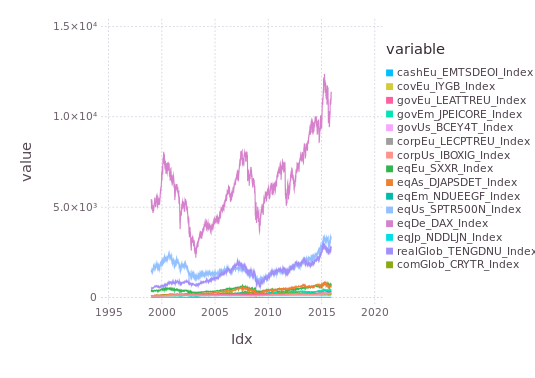

In [229]:
gdfPlot(priceData)

With normalized log prices

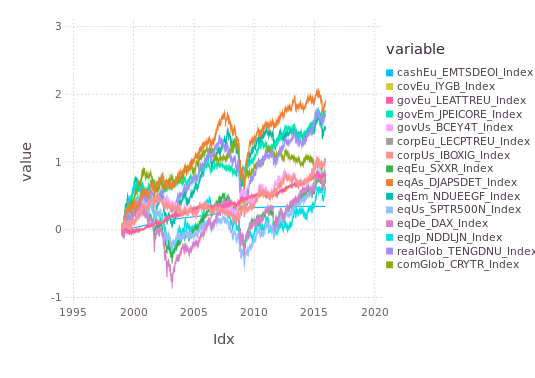

In [223]:
# prices without metadata
prices = asArr(priceData, Float64, NaN)

# cumulate log returns
logPrices = log(prices)
logRets = logPrices[2:end, :] - logPrices[1:end-1, :]
normedLogPrices = [zeros(1, nAss); cumsum(logRets, 1)]

# add metadata again
normedLogPriceData = Timematr(normedLogPrices, names(priceData), idx(priceData))

# plot 
gdfPlot(normedLogPriceData)

allow different color coding: according to risk class

In [230]:
function coloredAssetClasses(tn::AbstractTimedata, infoTable::DataFrame, infoVarCol::Symbol) 
    # column AssetLabel must appear in both tables
    
    nams = names(tn)
    tn = narowrm(tn)
    vals = asArr(tn, Float64, NaN) # NA to NaN
    dats = dat2num(tn)
    df = composeDataFrame([dats vals], [:Idx; nams])
    stackedData = stack(df, nams)

    # rename column name
    rename!(stackedData, :variable, :AssetLabel)

    # transform asset label symbols to UTF8Strings for join
    labs = UTF8String[string(xx) for xx in stackedData[:AssetLabel]]
    stackedData[:AssetLabel] = labs

    # join asset class
    subInfo = infoTable[:, [:AssetLabel, infoVarCol]]
    
    xx = join(stackedData, subInfo, on = :AssetLabel)
    Gadfly.plot(xx, x="Idx", y="value", group="AssetLabel", color=infoVarCol, Gadfly.Geom.line)
end

coloredAssetClasses (generic function with 3 methods)

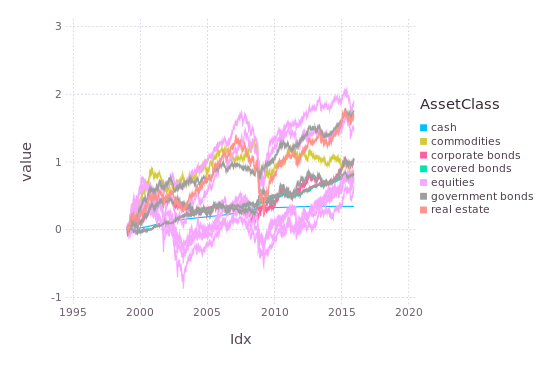

In [225]:
coloredAssetClasses(normedLogPriceData, assetInfo, :AssetClass)

colored according to risk class

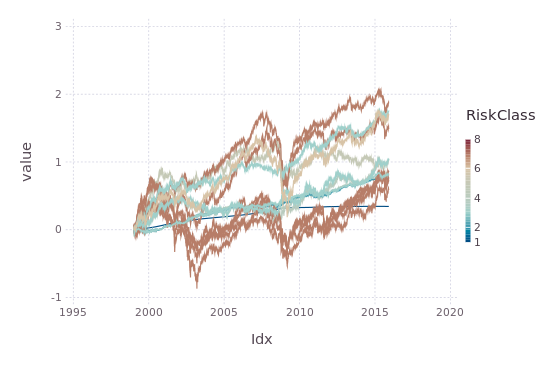

In [231]:
coloredAssetClasses(normedLogPriceData, assetInfo, :RiskClass)

with discrete returns

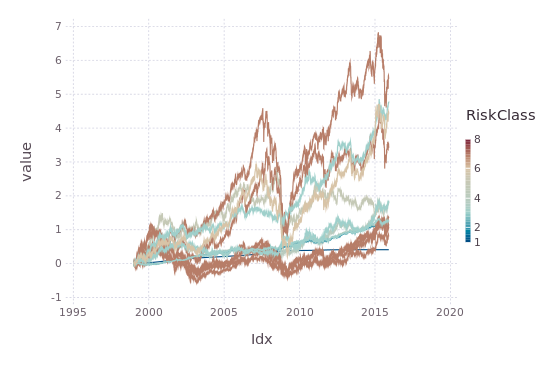

In [235]:
normedDiscRetsData = exp(normedLogPriceData) .- 1
coloredAssetClasses(normedDiscRetsData, assetInfo, :RiskClass)

#### Get statistics for asset time series

calculate weekly returns

In [236]:
weeklyEndDates = flipud([nObs:-5:1][:])
weeklyPriceData = priceData[weeklyEndDates, :]

weeklyDiscRetsData = price2ret(weeklyPriceData, log = false);

get return statistics

In [250]:
function getStatPerStock(statFunc::Function, statName::Symbol, tm::Timematr)
    statTable = collapseDates(statFunc, eachcol(tm))
    longTable = stack(statTable)
    rename!(longTable, :variable, :AssetLabel)
    rename!(longTable, :value, statName)
    stringAssetLabels = UTF8String[string(x) for x in longTable[:AssetLabel]]
    longTable[:AssetLabel] = stringAssetLabels
    return longTable
end

getStatPerStock (generic function with 1 method)

calculate statistics derived from price data

In [252]:
# get total return
totalRetPercentage = x -> (x[end] - x[1])./x[1]*100
retStatsTable = getStatPerStock(totalRetPercentage, :totRet, priceData)

# get first and last prices as check
firstPriceTable = getStatPerStock(x -> x[1], :P0, priceData)
lastPriceTable = getStatPerStock(x -> x[end], :PT, priceData)

# join first and last prices
retStatsTable = join(retStatsTable, firstPriceTable, on = :AssetLabel)
retStatsTable = join(retStatsTable, lastPriceTable, on = :AssetLabel);

calculate statistics derived from return data

In [253]:
retStatFuncs = [
    x -> ((geomean(1+x)^52)-1)*100;
    x -> std(x)*100;
    x -> std(x)*sqrt(52)*100;
    x -> quantile(x, 0.05)*100;
    x -> quantile(x, 0.05)*sqrt(52)*100;
    x -> minimum(x)*100]

statNams = [:annMean; :vola; :annVola; :VaR; :annVaR; :minRet]

for ii=1:length(retStatFuncs)
    xx = getStatPerStock(retStatFuncs[ii], statNams[ii], weeklyDiscRetsData)
    retStatsTable = join(retStatsTable, xx, on = :AssetLabel)
end

sortedTable = sort(retStatsTable, cols = [:totRet]);

show mean return / trend statistics

In [254]:
sortedTable[:, [:AssetLabel, :totRet, :P0, :PT, :annMean]]

,AssetLabel,totRet,P0,PT,annMean
1,cashEu_EMTSDEOI_Index,41.08070000000001,100.0,141.0807,2.1005847514213416
2,eqJp_NDDLJN_Index,80.02960962235912,7.50227358561825,13.5063138489899,3.638388509742807
3,eqEu_SXXR_Index,107.88020746193743,358.62,745.5,4.302051321155931
4,covEu_IYGB_Index,112.78391989354881,100.931311025496,214.7656,4.665885915547507
5,corpEu_LECPTREU_Index,115.62727610553698,107.64,232.1012,4.756821433471692
6,eqDe_DAX_Index,116.81110967260435,5252.36,11387.7,4.5639510649232
7,comGlob_CRYTR_Index,123.21199540121155,77.4182647630312,172.806853582555,4.758941427780661
8,govEu_LEATTREU_Index,127.24310560217545,108.7042,247.0228,5.08487382055014
9,eqUs_SPTR500N_Index,136.1715430928837,1409.57675086593,3329.0191635986,4.9941963537950995
10,corpUs_IBOXIG_Index,179.39984395959834,84.383881050942,235.768431983385,6.298246557559017


show weekly risk measures

In [255]:
sortedTable[:, [:AssetLabel, :annMean, :vola, :VaR, :minRet]]

,AssetLabel,annMean,vola,VaR,minRet
1,cashEu_EMTSDEOI_Index,2.1005847514213416,0.03174189949219231,-0.0008498490880591889,-0.0027636387343213313
2,eqJp_NDDLJN_Index,3.638388509742807,3.115506104091394,-4.855343243479661,-14.119925545896198
3,eqEu_SXXR_Index,4.302051321155931,2.6596454664426292,-4.309246390358915,-12.75448498286636
4,covEu_IYGB_Index,4.665885915547507,0.3638719980614528,-0.5175052780368316,-1.4673621957597183
5,corpEu_LECPTREU_Index,4.756821433471692,0.42732235675742053,-0.6074782496807641,-3.1328240354368773
6,eqDe_DAX_Index,4.5639510649232,3.363906970002876,-5.5446083794836625,-13.666853336112766
7,comGlob_CRYTR_Index,4.758941427780661,2.331395561418604,-3.6499666386112586,-10.599252563667612
8,govEu_LEATTREU_Index,5.08487382055014,0.5124443369359016,-0.7324564229649331,-1.8847410844542092
9,eqUs_SPTR500N_Index,4.9941963537950995,2.8871694159389873,-4.466758981764627,-17.01471892041005
10,corpUs_IBOXIG_Index,6.298246557559017,1.5959800851540622,-2.2233453604441977,-9.391022280050114


show annualized risk measures

In [256]:
sortedTable[:, [:AssetLabel, :annMean, :annVola, :annVaR]]

,AssetLabel,annMean,annVola,annVaR
1,cashEu_EMTSDEOI_Index,2.1005847514213416,0.22889409239944744,-0.0061283489268074325
2,eqJp_NDDLJN_Index,3.638388509742807,22.46623401464514,-35.012378048687104
3,eqEu_SXXR_Index,4.302051321155931,19.178976207628477,-31.074417638094353
4,covEu_IYGB_Index,4.665885915547507,2.6239182934322027,-3.7317836305700887
5,corpEu_LECPTREU_Index,4.756821433471692,3.0814653368819904,-4.380587955906221
6,eqDe_DAX_Index,4.5639510649232,24.257478132472144,-39.982739629191286
7,comGlob_CRYTR_Index,4.758941427780661,16.81193248016786,-26.320283738491668
8,govEu_LEATTREU_Index,5.08487382055014,3.6952886652870762,-5.281818380086011
9,eqUs_SPTR500N_Index,4.9941963537950995,20.819674740238874,-32.21025708778336
10,corpUs_IBOXIG_Index,6.298246557559017,11.50877606328471,-16.03277140029304


colorize with respect to vola

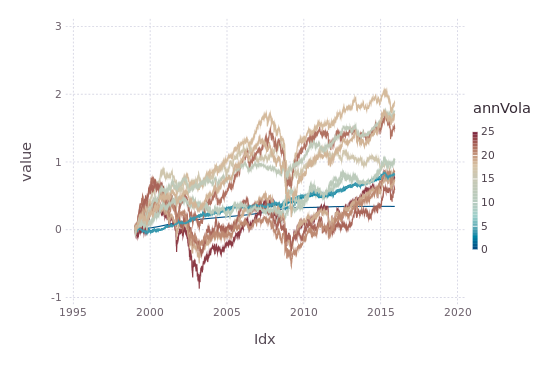

In [258]:
volaTable = join(assetInfo, sortedTable, on = :AssetLabel)

coloredAssetClasses(normedLogPriceData, volaTable, :annVola)

#### Drawdown

A kind of equivalent to volatility multi-period risk statistics for VaR is drawdown. 